<div style="padding: 20px; background-color: #000080; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);">
    <div style="border: 2px solid #000080; padding: 20px; text-align: center; border-radius: 10px; background-color: #ffffff;">
        <h1 style="color: #ffff00; font-size: 32px; text-transform: uppercase; letter-spacing: 2px; margin-bottom: 20px;">Easy EDA & modelling with BlueCast</h1>
        <div><em>
       If you like the content please consider an upvote. It is a great motivator to keep sharing code and ideas.
        Thank you!!!
    </em></div>
</div>

<h1 style="background-color: #000080; color: #ffff00;">Introducing BlueCast</h1>

Bluecast is an automl framework that offers a lightweight library with EDA, automl and xperiment tracking capabilities.
It offers many options for customization. Check out the repo to see many examples:
https://github.com/ThomasMeissnerDS/BlueCast

<h1 style="background-color: #000080; color: #ffff00;">Table of contents</h1>

* [Load the data](#1)
* [Feature engineering](#2)
    * [Add running features](#2.1)
* [EDA with BlueCast](#3)
    * [Target class distribution](#3.1)
    * [Feature type detection](#3.2)
    * [Univariate plots](#3.3)    
    * [Bivariate plots](#3.4) 
    * [Count pairs](#3.5)
    * [Correlation to target](#3.6)  
    * [Correlation heatmap](#3.7) 
    * [Mutual informtion score](#3.8)
    * [Dimensionality reduction using PCA](#3.9) 
    * [Show cumulative variance of principal components](#3.10)
    * [Dimensionality reduction using t-SNE](#3.11) 
    * [Map of associations between categorical features](#3.12)
    * [Missing values](#3.13)
    * [Do we have columns with high cardinality?](#3.14) 
* [Leakage detection](#4)
    * [Leakage detection for numerical columns](#4.1)
    * [Leakage detection for categorical columns](#4.2)  
* [Check for data drift](#5)
    * [Data drift for numerical columns](#5.1)
    * [## Data drift for categorical columns](#5.2)
* [Building the pipeline in a few lines of code](#6)
* [Plot decision trees](#7)
* [Predict on new data](#8) 
* [Accessing the inbuilt experiment tracker](#9) 
    * [Understand most impactful parameters across all hyperparameters tests and model trainings](#9.1)
    * [Don't lose your progress!](#9.2) 
* [Submission time](#10)

In [1]:
from IPython.core.display import HTML

# Define custom CSS directly in Python variable
custom_css = """
<style>
  :root {
    --header1_color: #204709;
    --header2_color: #42841F;
    --header3_color: #6EAF4B;
    --keyword_color: #cc241d; /* import */
    --string_color: #79740e;
    --number_color: #b16286;
    --def_color: #689d6a; /* class name */
    --property_color: #458588; /* python properties */
    --builtin_color: #689d6a;
    --comment_color: #9f9f9f;
    --comment_color_2: #458588; /* equals sign */
    --operator_color: #a221f2;
    --font_color: #3c3836; /* general font */
    --variable2_color: #b16286; /*self keyworda */
    --box_color: #fffdee66;
  }

  /* Add the following style for headers with background color */
  h1,
  .h1 {
    font-family: "Trebuchet MS", sans-serif;
    font-size: 2em !important;
    letter-spacing: 1px;
    color: var(--header1_color);
    border-bottom: 3px solid var(--header1_color);
    background-color: #000080;
    padding: 0.5em;
    color: #ffff00 !important;
  }

  h2,
  .h2 {
    font-family: "Trebuchet MS";
    font-size: 1.7em !important;
    color: var(--header2_color);
    background-color: #000080;
    padding: 0.5em;
    color: #ffff00 !important;
  }

  h3,
  .h3 {
    font-family: "Trebuchet MS";
    font-size: 1.4em !important;
    color: var(--header3_color);
    background-color: #000080;
    padding: 0.5em;
    color: #ffff00 !important;
  }

  /* Rest of your existing styles... */

  body[data-jp-theme-light="true"] .jp-Notebook .CodeMirror.cm-s-jupyter {
    background-color: var(--box_color) !important;
  }

  div.input_area {
    background-color: var(--box_color) !important;
  }
</style>

"""

# Apply custom CSS
HTML(custom_css)

In [2]:
%%capture
!pip install bluecast #--no-index --find-links=file:/kaggle/input/bluecast/bluecast-0.90-py3-none-any.whl

<a id="toc"></a>

<a href="#toc" style="background-color: #E1B12D; color: #ffffff; padding: 7px 10px; text-decoration: none; border-radius: 50px;">Back to top</a><a id="toc"></a>

<a id="1.2"></a>

# Load the data

In [3]:
from category_encoders import (
    GLMMEncoder,
    LeaveOneOutEncoder,
    OneHotEncoder,
    OrdinalEncoder,
    TargetEncoder,
    WOEEncoder,
)

from sklearn.decomposition import PCA
from sklearn.preprocessing import RobustScaler

import numpy as np
import pandas as pd
import re
from typing import Optional, Tuple, Union

import matplotlib.pyplot as plt
from xgboost import plot_tree

import warnings
warnings.filterwarnings("ignore")


from bluecast.blueprints.cast import BlueCast
from bluecast.blueprints.cast_cv import BlueCastCV
from bluecast.config.training_config import TrainingConfig, XgboostTuneParamsConfig
from bluecast.preprocessing.custom import CustomPreprocessing
from bluecast.general_utils.general_utils import save_to_production, load_for_production

from sklearn.model_selection import StratifiedKFold, RepeatedStratifiedKFold
from sklearn.preprocessing import PowerTransformer, LabelEncoder

In [4]:
train = pd.read_csv('/kaggle/input/playground-series-s4e2/train.csv')
train["source"] = 0

df_orig = pd.read_csv('/kaggle/input/obesity-or-cvd-risk-classifyregressorcluster/ObesityDataSet.csv')
df_orig["source"] = 1

test = pd.read_csv('/kaggle/input/playground-series-s4e2/test.csv')
test["source"] = 1
submission = pd.read_csv('/kaggle/input/playground-series-s4e2/sample_submission.csv')

cols = df_orig.columns
train = pd.concat((train, df_orig), axis=0).reset_index(drop=True)

print('The dimension of the train dataset is:', train.shape)
print('The dimension of the test dataset is:', test.shape)

The dimension of the train dataset is: (22869, 19)
The dimension of the test dataset is: (13840, 18)


In [5]:
train

,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad,source
0,0.0,Male,24.443011,1.699998,81.669950,yes,yes,2.000000,2.983297,Sometimes,no,2.763573,no,0.000000,0.976473,Sometimes,Public_Transportation,Overweight_Level_II,0
1,1.0,Female,18.000000,1.560000,57.000000,yes,yes,2.000000,3.000000,Frequently,no,2.000000,no,1.000000,1.000000,no,Automobile,Normal_Weight,0
2,2.0,Female,18.000000,1.711460,50.165754,yes,yes,1.880534,1.411685,Sometimes,no,1.910378,no,0.866045,1.673584,no,Public_Transportation,Insufficient_Weight,0
3,3.0,Female,20.952737,1.710730,131.274851,yes,yes,3.000000,3.000000,Sometimes,no,1.674061,no,1.467863,0.780199,Sometimes,Public_Transportation,Obesity_Type_III,0
4,4.0,Male,31.641081,1.914186,93.798055,yes,yes,2.679664,1.971472,Sometimes,no,1.979848,no,1.967973,0.931721,Sometimes,Public_Transportation,Overweight_Level_II,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22864,NaN,Female,20.976842,1.710730,131.408528,yes,yes,3.000000,3.000000,Sometimes,no,1.728139,no,1.676269,0.906247,Sometimes,Public_Transportation,Obesity_Type_III,1
22865,NaN,Female,21.982942,1.748584,133.742943,yes,yes,3.000000,3.000000,Sometimes,no,2.005130,no,1.341390,0.599270,Sometimes,Public_Transportation,Obesity_Type_III,1
22866,NaN,Female,22.524036,1.752206,133.689352,yes,yes,3.000000,3.000000,Sometimes,no,2.054193,no,1.414209,0.646288,Sometimes,Public_Transportation,Obesity_Type_III,1
22867,NaN,Female,24.361936,1.739450,133.346641,yes,yes,3.000000,3.000000,Sometimes,no,2.852339,no,1.139107,0.586035,Sometimes,Public_Transportation,Obesity_Type_III,1


In [6]:
test

,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,source
0,20758,Male,26.899886,1.848294,120.644178,yes,yes,2.938616,3.000000,Sometimes,no,2.825629,no,0.855400,0.000000,Sometimes,Public_Transportation,1
1,20759,Female,21.000000,1.600000,66.000000,yes,yes,2.000000,1.000000,Sometimes,no,3.000000,no,1.000000,0.000000,Sometimes,Public_Transportation,1
2,20760,Female,26.000000,1.643355,111.600553,yes,yes,3.000000,3.000000,Sometimes,no,2.621877,no,0.000000,0.250502,Sometimes,Public_Transportation,1
3,20761,Male,20.979254,1.553127,103.669116,yes,yes,2.000000,2.977909,Sometimes,no,2.786417,no,0.094851,0.000000,Sometimes,Public_Transportation,1
4,20762,Female,26.000000,1.627396,104.835346,yes,yes,3.000000,3.000000,Sometimes,no,2.653531,no,0.000000,0.741069,Sometimes,Public_Transportation,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13835,34593,Male,23.327836,1.721384,78.030383,yes,no,2.813234,3.000000,Sometimes,no,1.000000,no,0.807076,0.778632,Sometimes,Public_Transportation,1
13836,34594,Female,29.000000,1.590000,62.000000,no,yes,3.000000,3.000000,Sometimes,no,2.000000,no,0.000000,0.000000,Sometimes,Public_Transportation,1
13837,34595,Female,22.935612,1.585547,44.376637,no,yes,3.000000,2.273740,Frequently,no,2.000000,no,1.949840,1.000000,Sometimes,Public_Transportation,1
13838,34596,Male,21.000000,1.620000,53.000000,yes,yes,2.000000,3.000000,Sometimes,no,2.000000,no,3.000000,2.000000,no,Public_Transportation,1


In [7]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22869 entries, 0 to 22868
Data columns (total 19 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              20758 non-null  float64
 1   Gender                          22869 non-null  object 
 2   Age                             22869 non-null  float64
 3   Height                          22869 non-null  float64
 4   Weight                          22869 non-null  float64
 5   family_history_with_overweight  22869 non-null  object 
 6   FAVC                            22869 non-null  object 
 7   FCVC                            22869 non-null  float64
 8   NCP                             22869 non-null  float64
 9   CAEC                            22869 non-null  object 
 10  SMOKE                           22869 non-null  object 
 11  CH2O                            22869 non-null  float64
 12  SCC                             

In [8]:
train.describe()

,id,Age,Height,Weight,FCVC,NCP,CH2O,FAF,TUE,source
count,20758.00000,22869.000000,22869.000000,22869.000000,22869.000000,22869.000000,22869.000000,22869.000000,22869.000000,22869.000000
mean,10378.50000,23.885263,1.700377,87.767610,2.443428,2.754344,2.027442,0.984382,0.620551,0.092308
std,5992.46278,5.753419,0.087881,26.364243,0.533329,0.712711,0.608901,0.839466,0.602850,0.289467
min,0.00000,14.000000,1.450000,39.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
25%,5189.25000,20.000000,1.631662,66.000000,2.000000,3.000000,1.755907,0.015860,0.000000,0.000000
50%,10378.50000,22.815416,1.700000,84.000000,2.392665,3.000000,2.000000,1.000000,0.579541,0.000000
75%,15567.75000,26.000000,1.763029,111.531208,3.000000,3.000000,2.535127,1.596576,1.000000,0.000000
max,20757.00000,61.000000,1.980000,173.000000,3.000000,4.000000,3.000000,3.000000,2.000000,1.000000


<a id="toc"></a>

<a href="#toc" style="background-color: #E1B12D; color: #ffffff; padding: 7px 10px; text-decoration: none; border-radius: 50px;">Back to top</a><a id="toc"></a>

<a id="1.2"></a>

# Feature engineering

In this section we will build features using various techniques.

In [9]:
target = "NObeyesdad"

In [10]:
# from here: https://www.kaggle.com/code/natapelysynka/obesity-risk-multiclassifier-feature-eng-xgb0-97
def transform_feats(data):
    data['Gender_binary'] = data['Gender'].map({'Male': 1, 'Female': 0}).astype(int)
    data['family_history_with_overweight_binary'] = data['family_history_with_overweight'].map({'yes': 1, 'no': 0}).astype(int)
    data['SMOKE_binary'] = data['SMOKE'].map({'yes': 1, 'no': 0}).astype(int)
    
    # taken from: https://www.kaggle.com/code/ravi20076/playgrounds4e02-extraftre-models
    data["CAEC"] = data["CAEC"].map({"no": 0, "Sometimes": 1, "Frequently": 2, "Always": 3}).astype(np.uint8)
    data['SCC']  = np.where(data["SCC"] == "no", 1,0).astype(np.uint8)
    data["CALC"] = data["CALC"].map({"no": 0, "Sometimes": 1, "Frequently": 2, "Always": 2}).astype(np.uint8)
    return data

def feature_engineering(data):
    # BMI
    data['BMI'] = data['Weight'] / (data['Height'] ** 2)
    # Activity
    data['Activity'] = data['FAF'] * data['TUE']
    # Age group
    data['Age_Group'] = pd.cut(data['Age'], bins=[0, 18, 30, 45, float('inf')], labels=[0, 1, 2, 3])
    data['Age_Group'] = data['Age_Group'].astype(int)
    # Height group
    data['Height_Group'] = pd.cut(data['Height'], bins=[0, 1.5, 1.6, 1.7, 1.8, 1.9, 2.0, float('inf')], labels=[0, 1, 2, 3, 4, 5, 6])
    data['Height_Group'] = data['Height_Group'].astype(int)
    #Risk score
    data['Risk factor'] = (data['BMI'] + data['Age_Group']) * (data["family_history_with_overweight_binary"] + data["SMOKE_binary"])
    
    # taken from: https://www.kaggle.com/code/ravi20076/playgrounds4e02-extraftre-models
    data["BMIbyNCP"] = np.log1p(data["BMI"]) - np.log1p(data["NCP"])
    data["BMIFAF"] = (data["BMI"] * data["FAF"])/ 25.0
    data["FAFmTUE"] = data["FAF"] - data["TUE"]
    data["FCVCpNCP"] = data['FCVC'] * data['NCP']
    data['TechUse'] = np.log1p(data['TUE']) - np.log1p(data['Age'])
    return data

In [11]:
train = transform_feats(train)
test = transform_feats(test)

In [12]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22869 entries, 0 to 22868
Data columns (total 22 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   id                                     20758 non-null  float64
 1   Gender                                 22869 non-null  object 
 2   Age                                    22869 non-null  float64
 3   Height                                 22869 non-null  float64
 4   Weight                                 22869 non-null  float64
 5   family_history_with_overweight         22869 non-null  object 
 6   FAVC                                   22869 non-null  object 
 7   FCVC                                   22869 non-null  float64
 8   NCP                                    22869 non-null  float64
 9   CAEC                                   22869 non-null  uint8  
 10  SMOKE                                  22869 non-null  object 
 11  CH

In [13]:
def get_group_zscores(df, group_cols, agg_col):
    df_gr = df.groupby(group_cols).agg({agg_col: ["mean", "std"]}).droplevel(0, axis=1).reset_index()
    df_gr["mean"] = df_gr["mean"].fillna(df_gr["mean"].mean())
    df_gr["std"] = df_gr["std"].fillna(df_gr["std"].mean())
    
    identifier = "_".join(group_cols) + "_" + agg_col
    df_gr = df_gr.rename(
        columns = {
            "mean": f"{identifier}_mean",
            "std": f"{identifier}_std"
        }
    )
    df = df.merge(df_gr, on=group_cols, how="left")
    df[f"{identifier}_zscore"] = (df[f"{identifier}_mean"] - df[agg_col]) / df[f"{identifier}_std"]
    return df

In [14]:
train[target].value_counts()

NObeyesdad
Obesity_Type_III       4370
Obesity_Type_II        3545
Normal_Weight          3369
Obesity_Type_I         3261
Overweight_Level_II    2812
Insufficient_Weight    2795
Overweight_Level_I     2717
Name: count, dtype: int64

<a id="toc"></a>

<a href="#toc" style="background-color: #E1B12D; color: #ffffff; padding: 7px 10px; text-decoration: none; border-radius: 50px;">Back to top</a><a id="toc"></a>

<a id="1.2"></a>

# EDA with BlueCast

Here you can get an overview of the data and its distribution.

In [15]:
from bluecast.eda.analyse import (
    plot_pie_chart,
    plot_count_pairs,
    bi_variate_plots,
    correlation_heatmap,
    correlation_to_target,
    plot_pca,
    plot_pca_cumulative_variance,
    plot_theil_u_heatmap,
    plot_tsne,
    univariate_plots,
    check_unique_values,
    plot_null_percentage,
    mutual_info_to_target
)

from bluecast.preprocessing.feature_types import FeatureTypeDetector

## Feature type detection

In [16]:
ignore_cols = []

feat_type_detector = FeatureTypeDetector()
train_data = feat_type_detector.fit_transform_feature_types(train.drop(ignore_cols, axis=1))

len(feat_type_detector.num_columns)

2024-02-06 22:03:31.098291: Start detecting and casting feature types.


13

In [17]:
le = LabelEncoder()

# Target class distribution

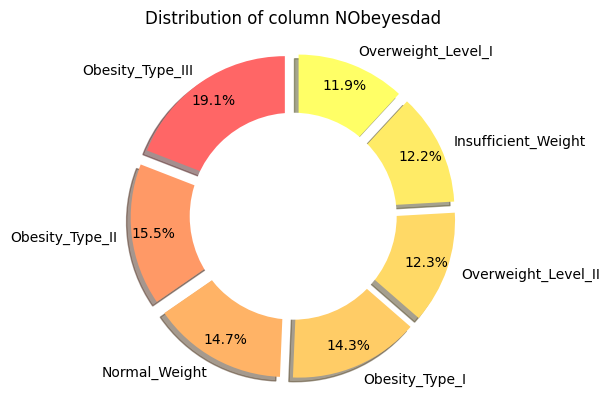

In [18]:
plot_pie_chart(
        train_data,
        target,
    )

## Univariate plots

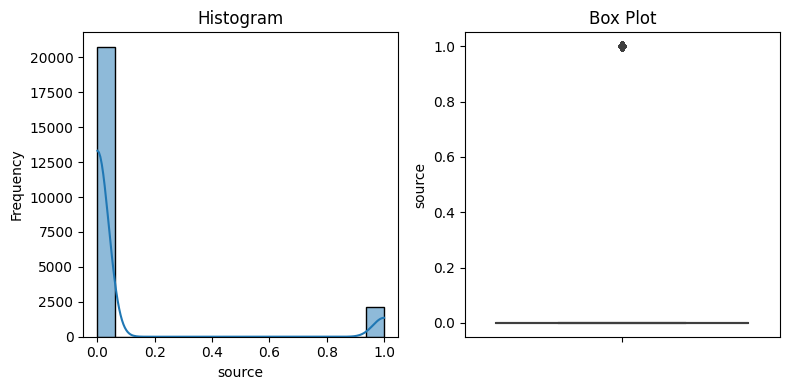

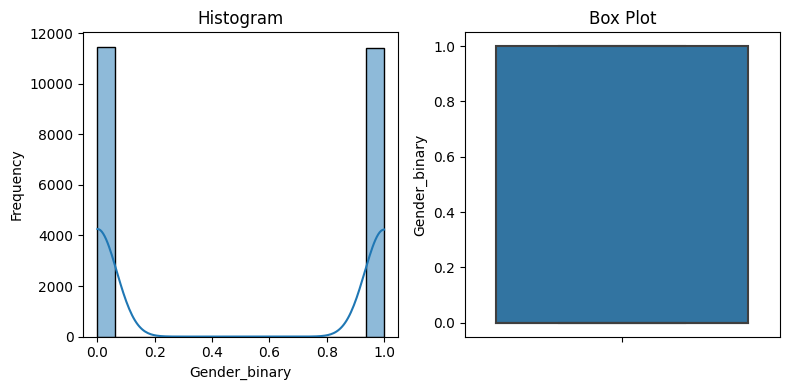

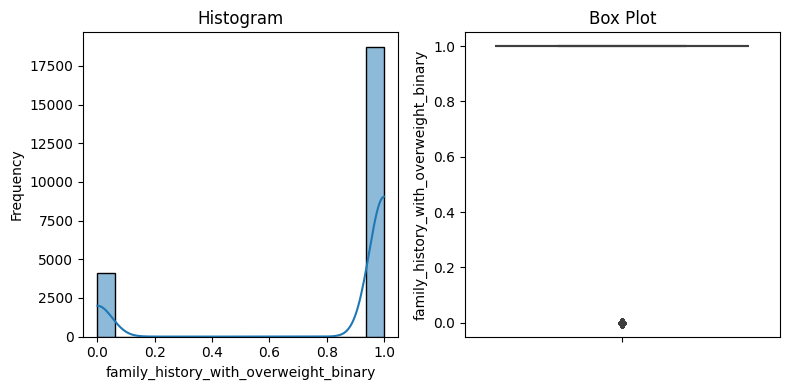

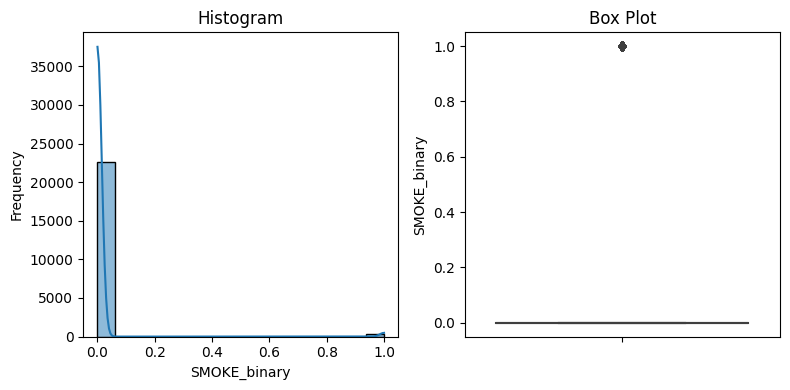

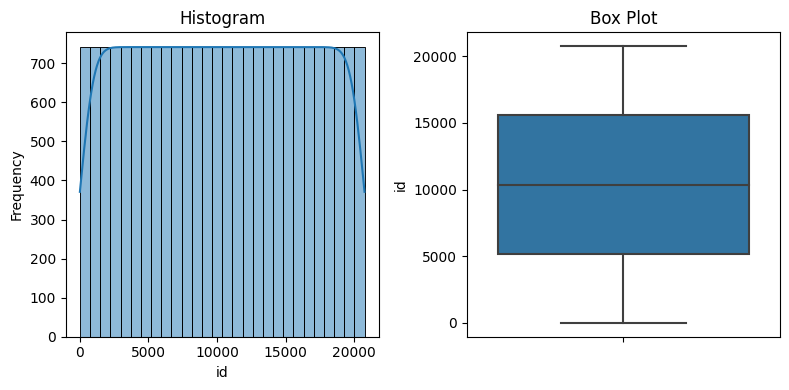

...

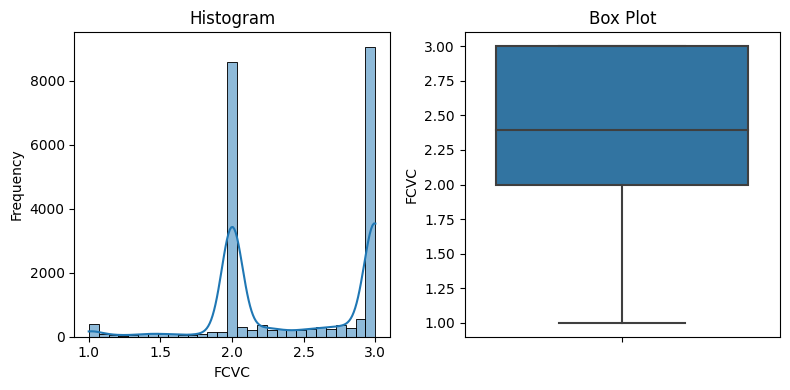

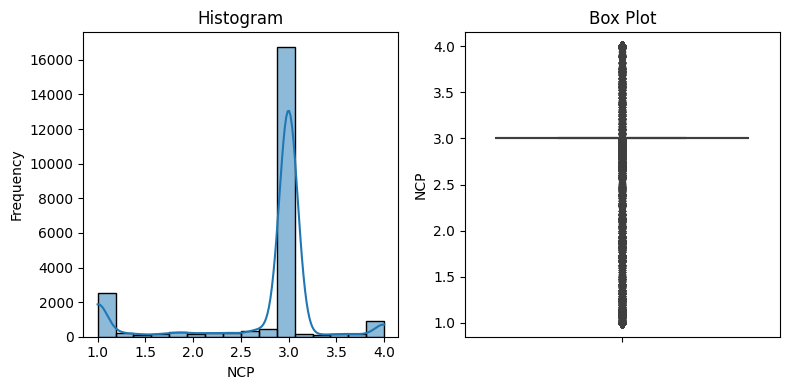

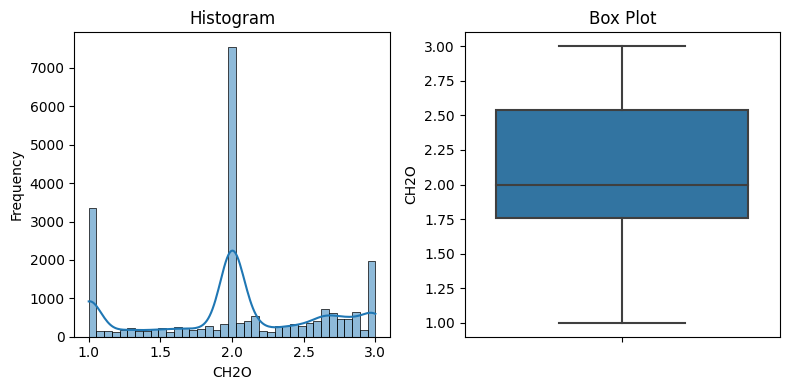

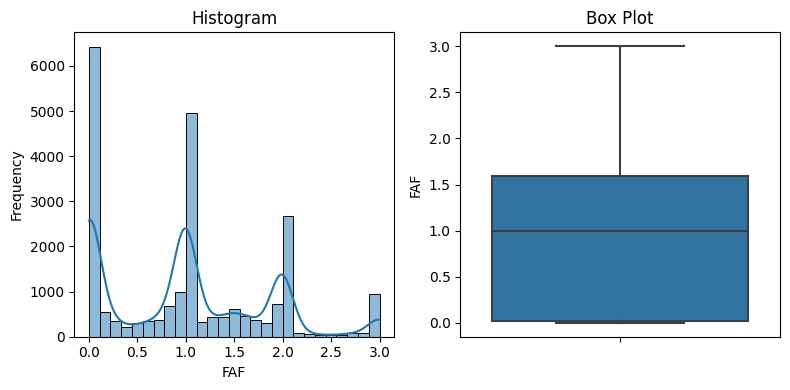

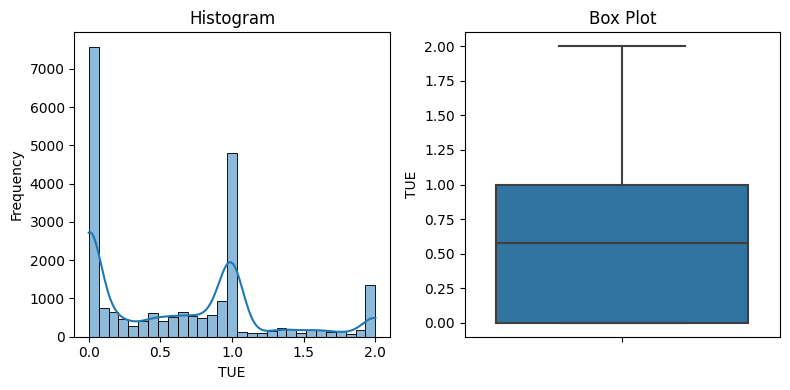

In [19]:
univariate_plots(
        train_data.loc[
            :, feat_type_detector.num_columns
        ],
    )

## Bivariate plots

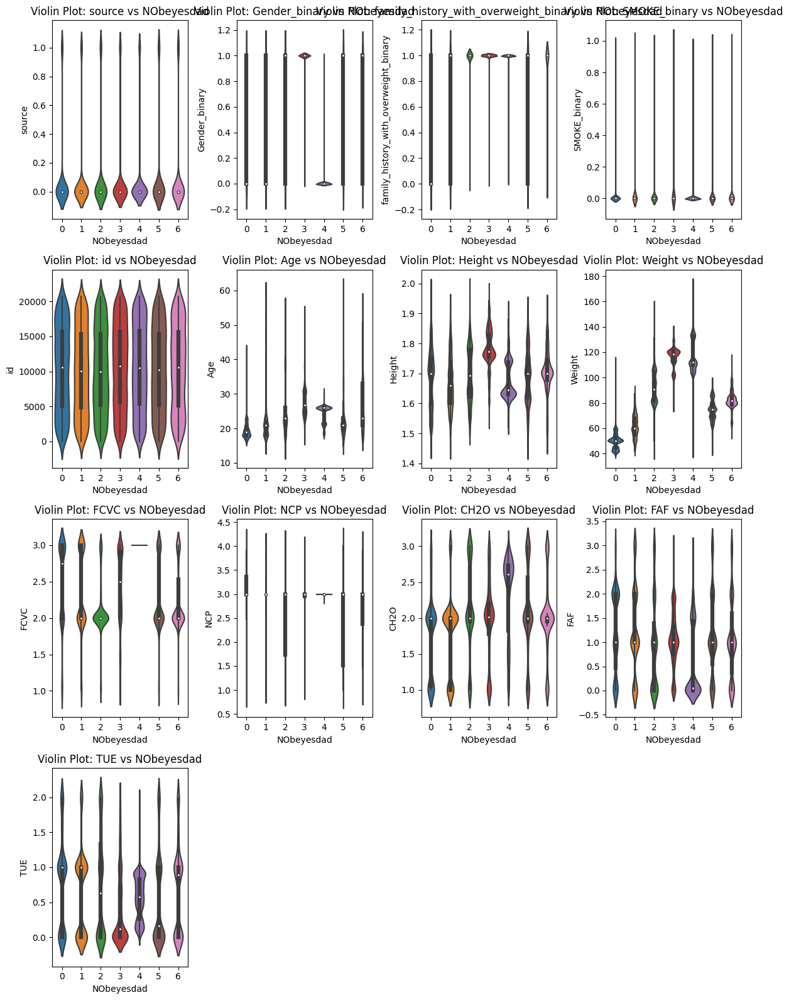

In [20]:
encoded_target_train = train.copy()
encoded_target_train[target] = le.fit_transform(encoded_target_train[target])

bi_variate_plots(
        encoded_target_train.loc[
            :, feat_type_detector.num_columns + [target]
        ],
        target,
    )

In some features we can see clear differences between the classes.

# Count pairs

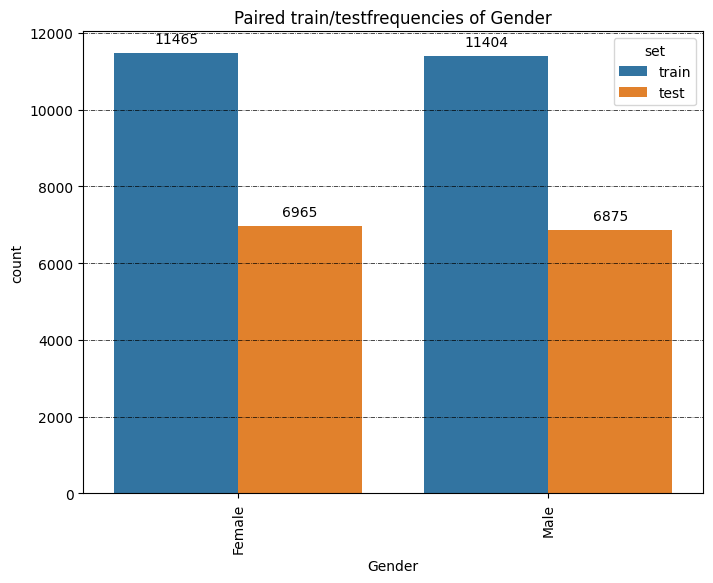

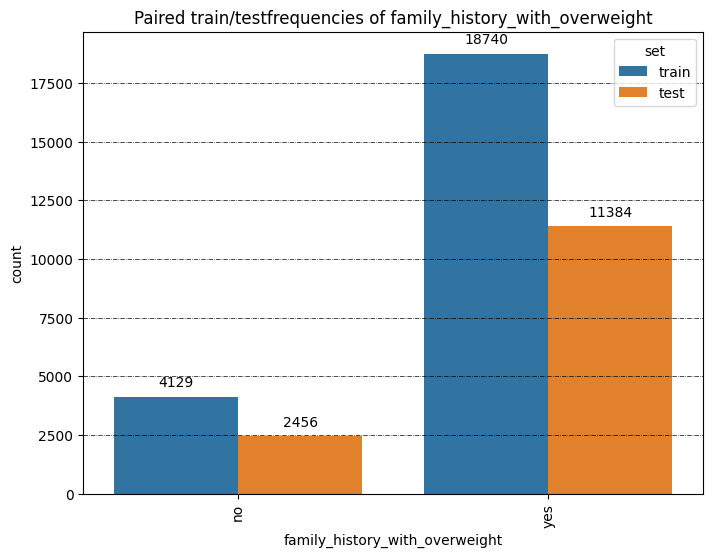

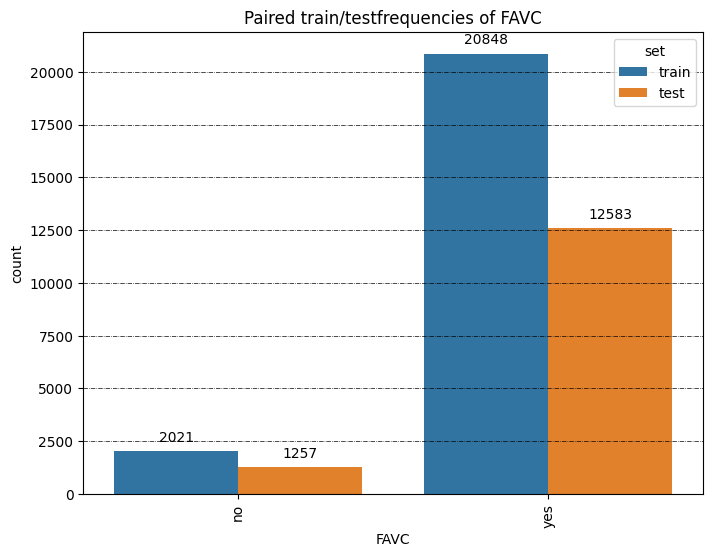

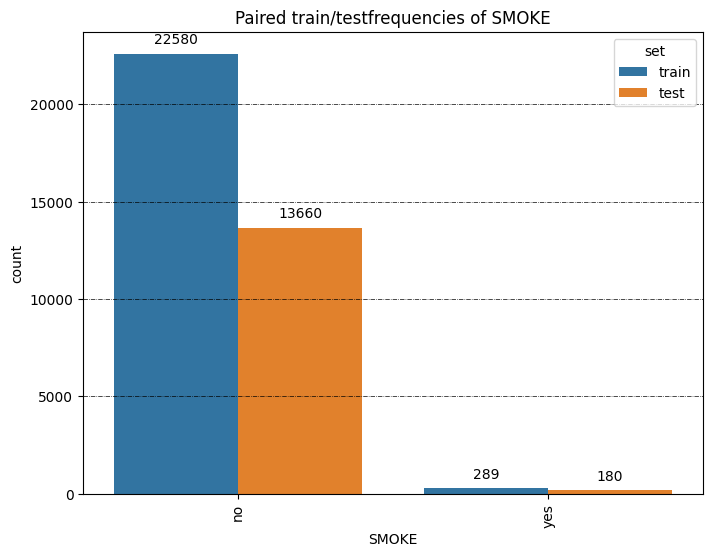

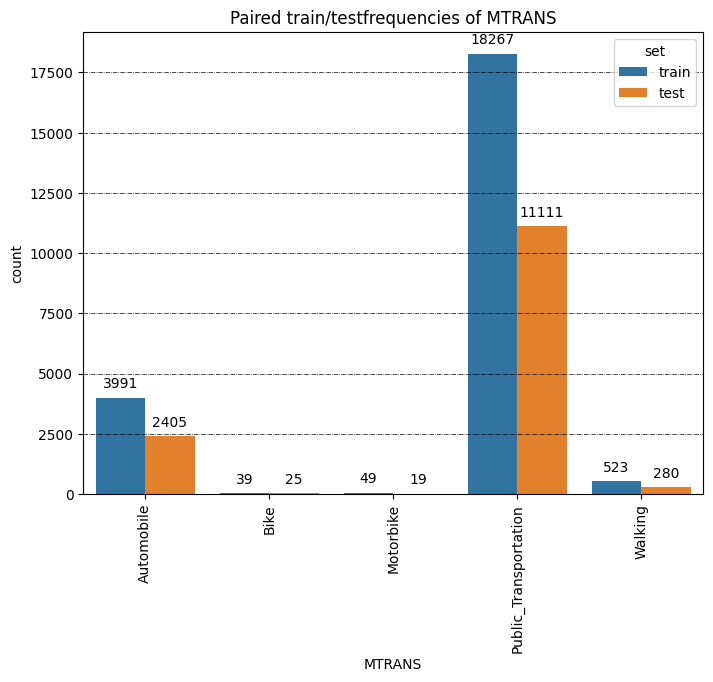

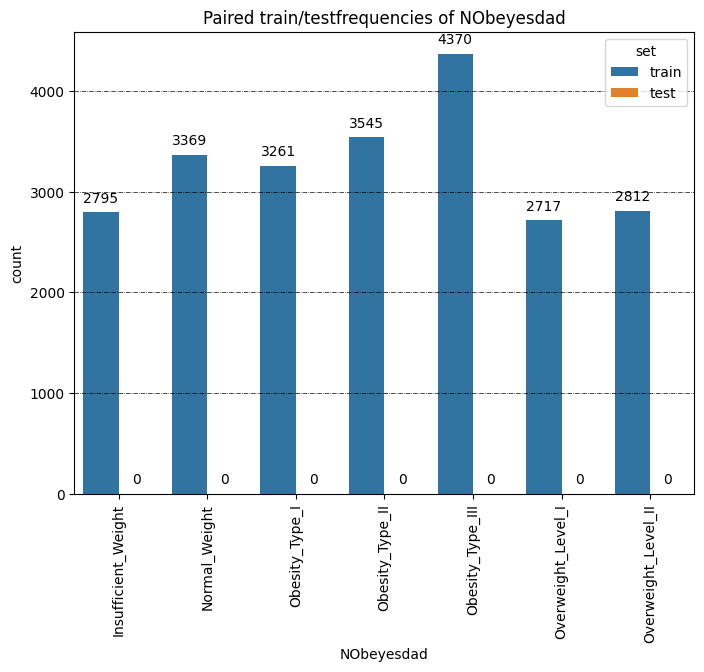

In [21]:
plot_count_pairs(
    train,
    test,
    cat_cols=train_data.loc[:, feat_type_detector.cat_columns],
      )

## Correlation to target

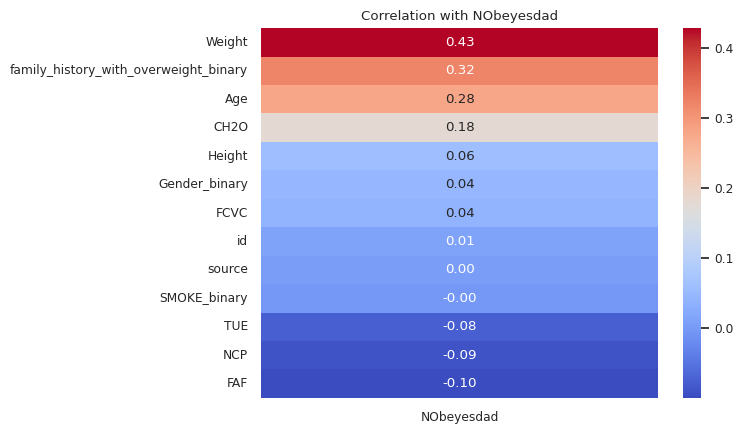

In [22]:
# show correlation to target
correlation_to_target(
    encoded_target_train.loc[:, feat_type_detector.num_columns + [target]],
      target,
      )

Weigh, hight and age show good correlation coeffcients. They have a linear relationship to the target.

## Correlation heatmap

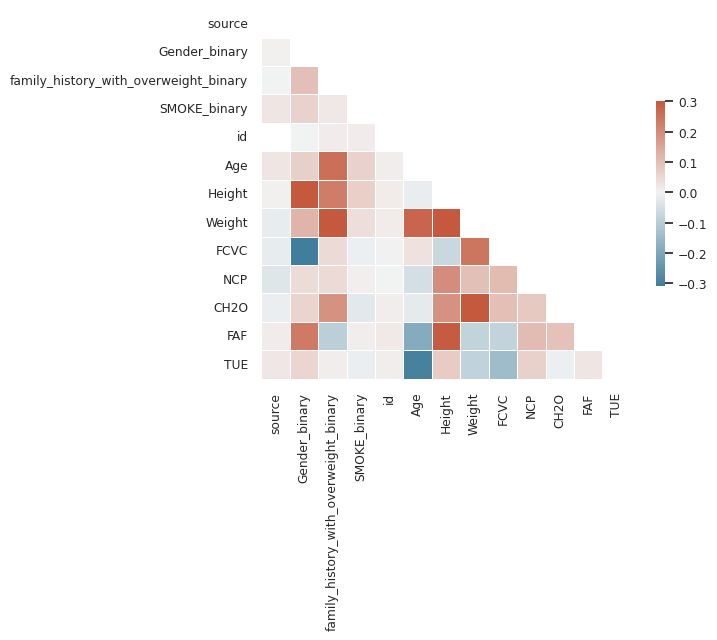

In [23]:
correlation_heatmap(train_data.loc[
            :, feat_type_detector.num_columns])

## Mutual information score

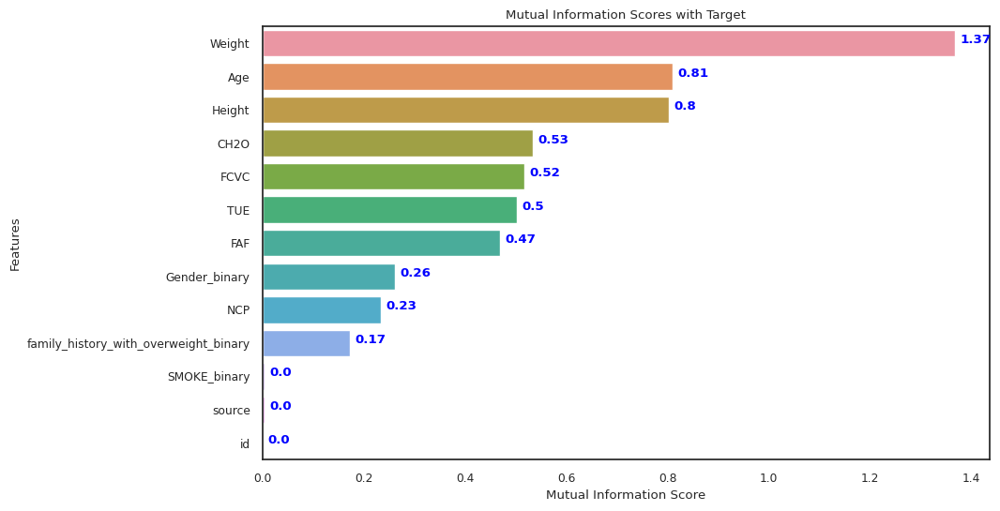

In [24]:
# show mutual information of categorical features to target
# features are expected to be numerical format
extra_params = {"random_state": 30}
mutual_info_to_target(encoded_target_train.loc[:, feat_type_detector.num_columns + [target]].fillna(0), target, class_problem="multiclass", **extra_params)

Weight, age and height have very high MI scores!

## Dimensionality reduction using PCA

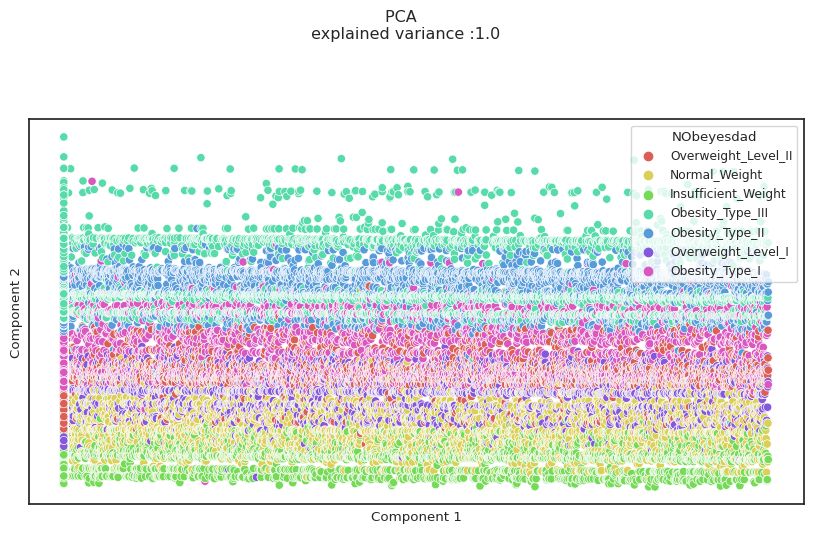

In [25]:
# show feature space after principal component analysis
plot_pca(train_data.loc[
            :, feat_type_detector.num_columns + [target]
        ].fillna(0), target)

It looks like linear models can be promising here. Most classes can be linearly separated very well.

## Show cumulative variance of principal components

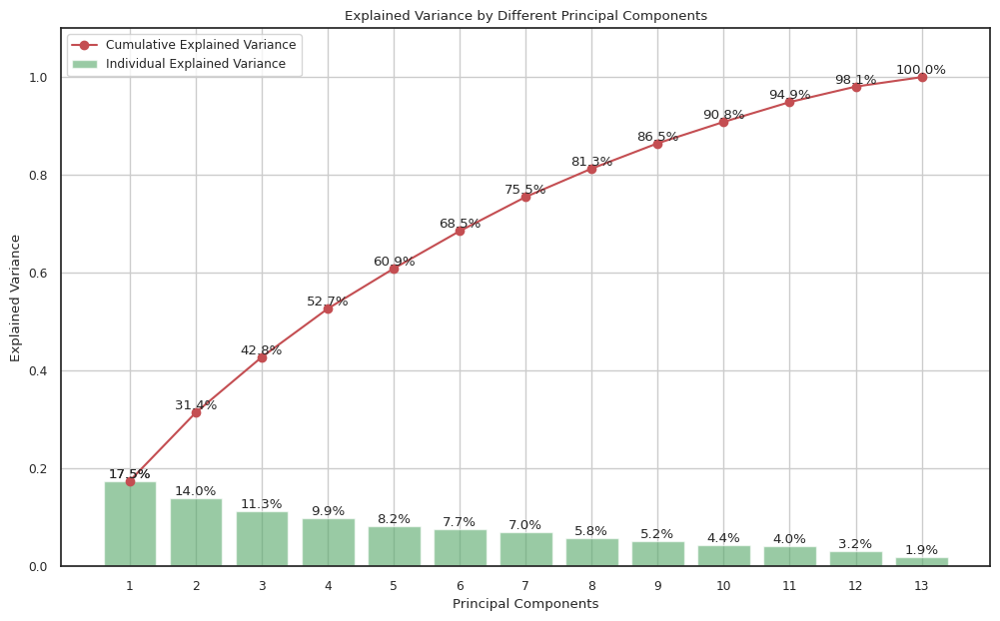

In [26]:
## show how many components are needed to explain certain variance
plot_pca_cumulative_variance(
    train_data.loc[:, feat_type_detector.num_columns].fillna(0),
    "target",
    n_components=13
    )

## Dimensionality reduction using t-SNE

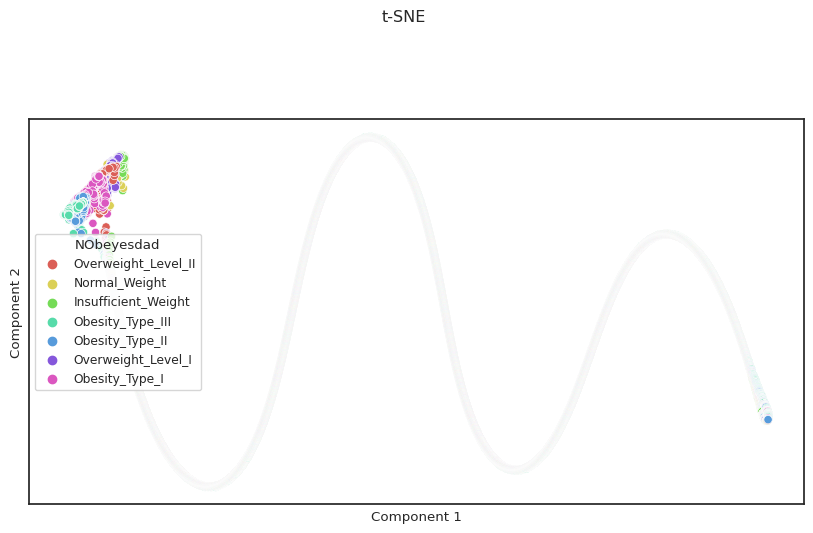

In [27]:
# show feature space after t-SNE
plot_tsne(train_data.loc[
            :, feat_type_detector.num_columns + [target]
        ].fillna(0), target, perplexity=1000, random_state=0)

## Map of associations between categorical features

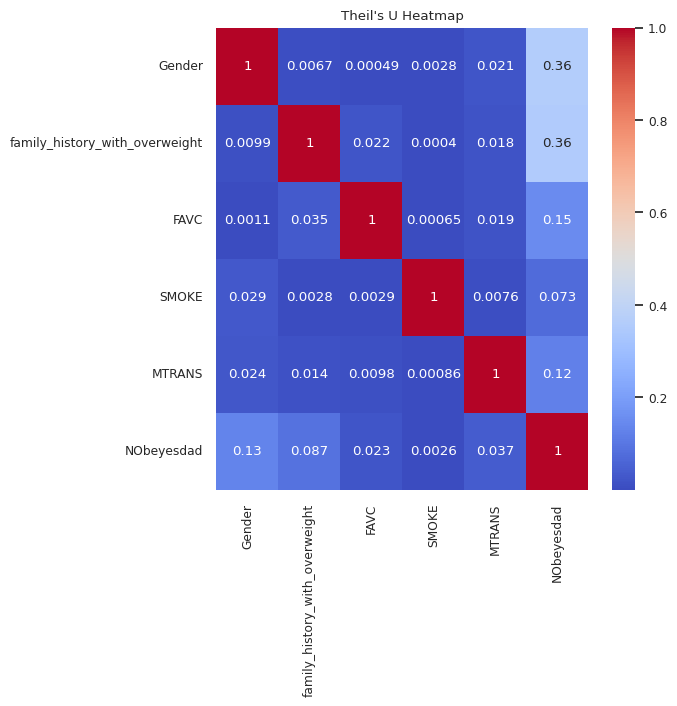

In [28]:
# show a heatmap of assocations between categorical variables
if len(feat_type_detector.cat_columns) > 0:
    theil_matrix = plot_theil_u_heatmap(train_data, feat_type_detector.cat_columns)
    theil_matrix

## Missing values

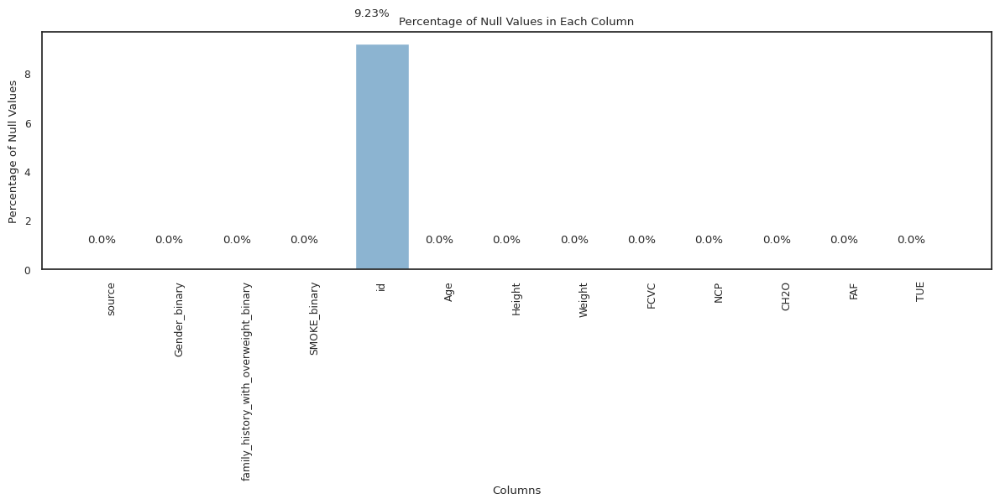

In [29]:
# plot the percentage of Nulls for all features
if train_data.loc[:, feat_type_detector.num_columns].isna().sum().sum() > 0:
    plot_null_percentage(
       train_data.loc[:, feat_type_detector.num_columns],
        )
else:
    print("This dataset does not have any missing values")

## Do we have columns with high cardinality?

In [30]:
# detect columns with a very high share of unique values
many_unique_cols = check_unique_values(train_data, feat_type_detector.cat_columns, threshold=0.90)
many_unique_cols

[]

# Leakage detection

With big data and complex pipelines data leakage can easily sneak in.
To detect leakage BlueCast offers two functions:

In [31]:
from bluecast.eda.data_leakage_checks import (
    detect_categorical_leakage,
    detect_leakage_via_correlation,
)

## Leakage detection for numerical columns

In [32]:
# Detect leakage of numeric columns based on correlation
numresult = detect_leakage_via_correlation(
        encoded_target_train.loc[:, feat_type_detector.num_columns + [target]], target, threshold=0.9 # target column is part of detected numerical columns here
    )
numresult

No leakage has been detected


[]

## Leakage detection for categorical columns

In [33]:
# Detect leakage of categorical columns based on Theil's U
result = detect_categorical_leakage(
        encoded_target_train.loc[:, feat_type_detector.cat_columns + [target]], target, threshold=0.9
    )
result

['family_history_with_overweight', 'FAVC', 'SMOKE']

This could also be a false positive when these features are contant. We might neeed to drop these.

# Check for data drift

In [34]:
from bluecast.monitoring.data_monitoring import DataDrift

In [35]:
data_drift = DataDrift()

## Data drift for numerical columns

In [36]:
data_drift.kolmogorov_smirnov_test(train, test)
data_drift.kolmogorov_smirnov_flags

2024-02-06 22:16:46.155208: Start checking for data drift via Kolmogorov-Smirnov test.


{'id': True,
 'Age': False,
 'Height': True,
 'Weight': False,
 'FCVC': False,
 'NCP': False,
 'CAEC': False,
 'CH2O': False,
 'SCC': False,
 'FAF': False,
 'TUE': True,
 'CALC': False,
 'source': True,
 'Gender_binary': False,
 'family_history_with_overweight_binary': False,
 'SMOKE_binary': False}

## Data drift for categorical columns

In [37]:
data_drift.population_stability_index(train.drop(target, axis=1), test)
data_drift.population_stability_index_flags

2024-02-06 22:16:46.527775: Start checking for data drift via population stability index.


{'id': True,
 'Age': False,
 'Height': False,
 'Weight': False,
 'FCVC': False,
 'NCP': False,
 'CAEC': False,
 'CH2O': False,
 'SCC': False,
 'FAF': False,
 'TUE': False,
 'CALC': False,
 'source': True,
 'Gender_binary': False,
 'family_history_with_overweight_binary': False,
 'SMOKE_binary': False}

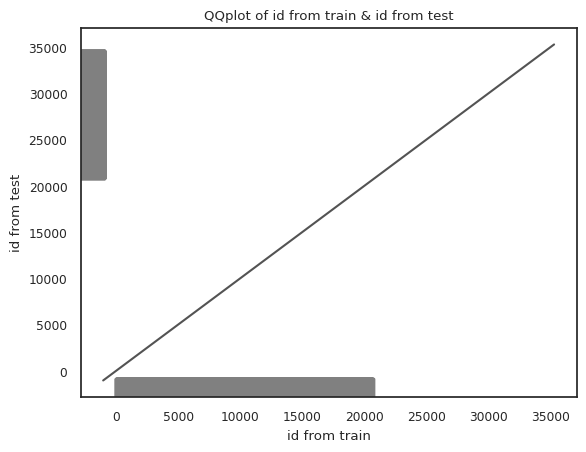

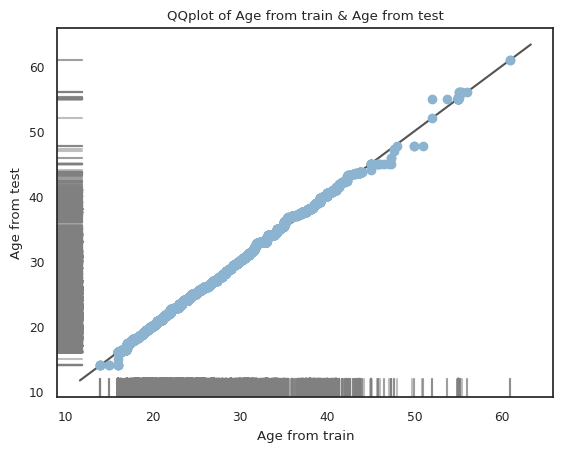

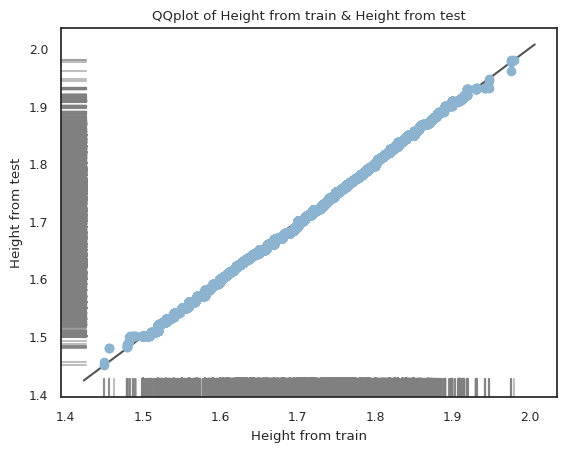

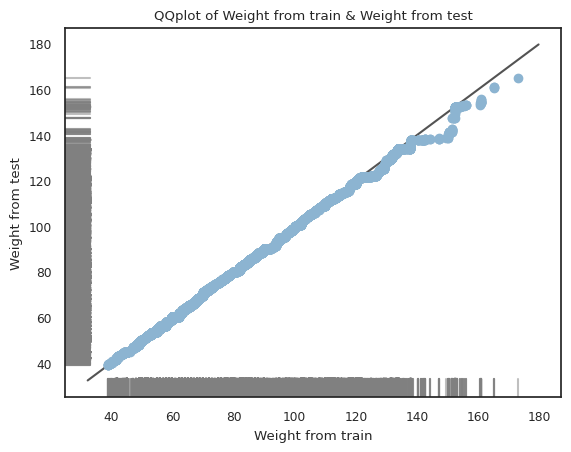

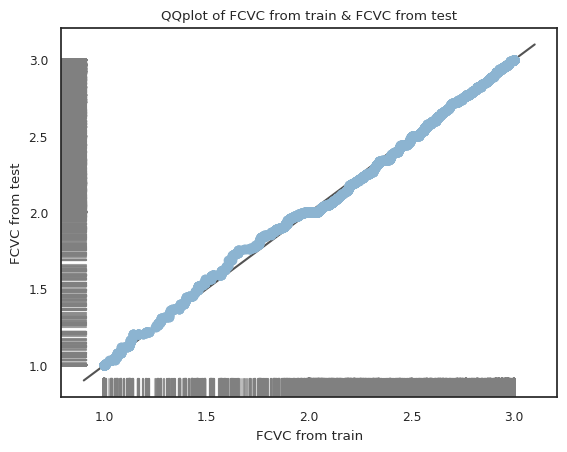

...

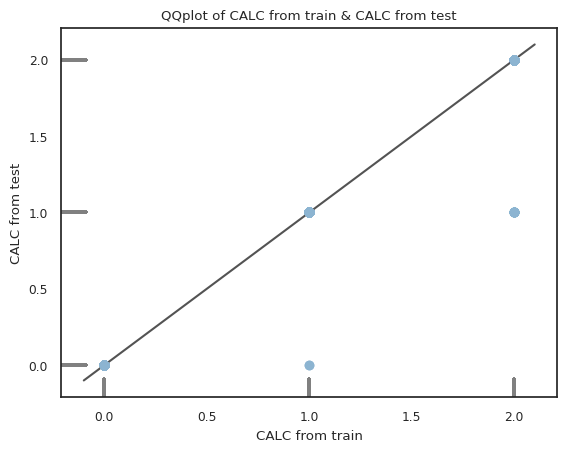

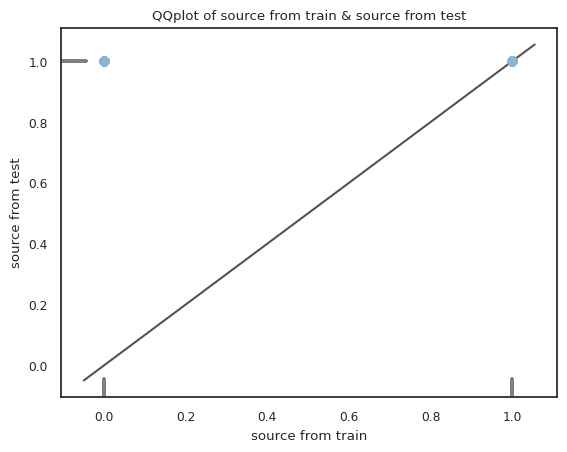

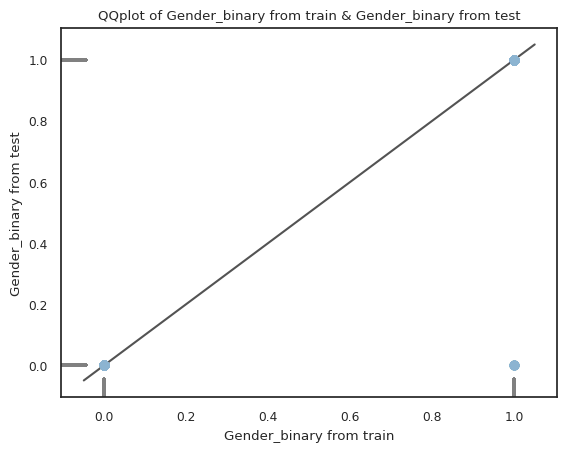

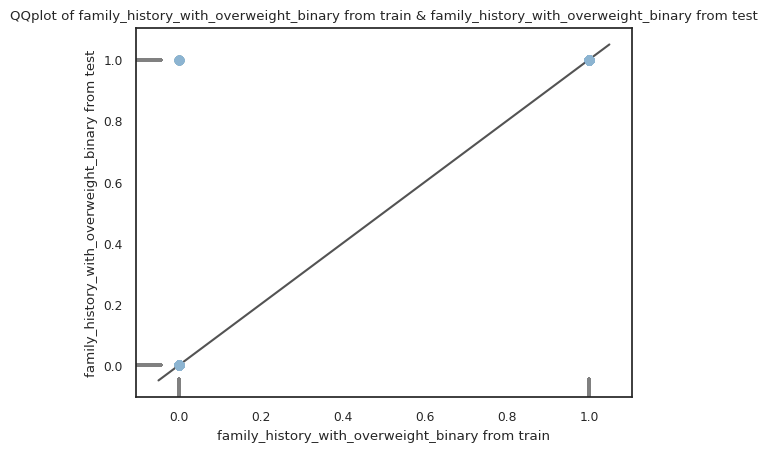

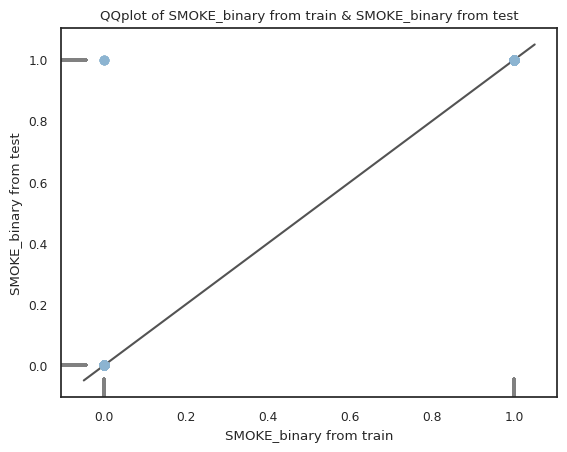

In [38]:
for col, data_drift_flag in data_drift.kolmogorov_smirnov_flags.items():
    data_drift.qqplot_two_samples(train[col], test[col], x_label=f"{col} from train", y_label=f"{col} from test")

Except from id column no data drift could be detected.

<a id="toc"></a>

<a href="#toc" style="background-color: #E1B12D; color: #ffffff; padding: 7px 10px; text-decoration: none; border-radius: 50px;">Back to top</a><a id="toc"></a>

<a id="1.2"></a>

# Building the pipeline in a few lines of code

In [39]:
from bluecast.blueprints.cast import BlueCast
from bluecast.preprocessing.custom import CustomPreprocessing

from sklearn.ensemble import IsolationForest


# add custom last mile computation
class CustomInFoldPreprocessing(CustomPreprocessing):
    def __init__(self):
        self.if_detector = None
    # Please note: The base class enforces that the fit_transform method is implemented
    def fit_transform(
        self, df: pd.DataFrame, target: pd.Series
    ) -> Tuple[pd.DataFrame, pd.Series]:
        train = df.copy()
        train = feature_engineering(train)
        train = get_group_zscores(train, ["Height_Group", "Age_Group"], "BMI")
        train = get_group_zscores(train, ["Height_Group", "Age_Group"], "Risk factor")
        train = get_group_zscores(train, ["Gender_binary", "SMOKE_binary", "family_history_with_overweight_binary"], "BMI")
        train = get_group_zscores(train, ["Gender_binary", "SMOKE_binary", "family_history_with_overweight_binary"], "Risk factor")
        train = train.drop(["source", "Age_Group", "Height_Group"], axis=1)
        train_target = target.copy().astype(float)
        train = train.replace([np.inf, -np.inf], 0)
        
        # add outlier scores as feature
        self.if_detector = IsolationForest(random_state=0)
        self.if_detector.fit(train.fillna(0))
        train["isolation_forest_scores"] = self.if_detector.predict(train.fillna(0))
        return train, train_target

    # Please note: The base class enforces that the fit_transform method is implemented
    def transform(
        self,
        df: pd.DataFrame,
        target: Optional[pd.Series] = None,
        predicton_mode: bool = False,
    ) -> Tuple[pd.DataFrame, Optional[pd.Series]]:
        train = df.copy()
        
        if isinstance(target, pd.Series) or isinstance(target, np.ndarray):
            train["target"] = target.copy()
            train["target"] = train["target"].astype(float)
            train = train.loc[train["source"] == 0].reset_index(drop=True) # no original data
            target = train.pop("target")
            target = pd.Series(target).astype(float)
        
        train = feature_engineering(train)
        train = get_group_zscores(train, ["Height_Group", "Age_Group"], "BMI")
        train = get_group_zscores(train, ["Height_Group", "Age_Group"], "Risk factor")
        train = get_group_zscores(train, ["Gender_binary", "SMOKE_binary", "family_history_with_overweight_binary"], "BMI")
        train = get_group_zscores(train, ["Gender_binary", "SMOKE_binary", "family_history_with_overweight_binary"], "Risk factor")
        train = train.drop(["source", "Age_Group", "Height_Group"], axis=1)
        train = train.replace([np.inf, -np.inf], 0)
        
        train["isolation_forest_scores"] = self.if_detector.predict(train.fillna(0))
        return train, target

custom_preprocessor = CustomInFoldPreprocessing()

In [40]:
from bluecast.config.training_config import TrainingConfig, XgboostTuneParamsConfig

# We give more depth
xgboost_param_config = XgboostTuneParamsConfig()
xgboost_param_config.steps_max = 1000
xgboost_param_config.max_depth_max = 7

# Create a custom training config and adjust general training parameters
train_config = TrainingConfig()
train_config.global_random_state = 600
train_config.hypertuning_cv_folds = 1
train_config.hyperparameter_tuning_rounds = 500
train_config.hyperparameter_tuning_max_runtime_secs = 60 * 60 * 2
#train_config.enable_grid_search_fine_tuning = True # enable param refinement
train_config.use_full_data_for_final_model = True
train_config.precise_cv_tuning = True
train_config.gridsearch_nb_parameters_per_grid = 5
#train_config.cat_encoding_via_ml_algorithm = True
#train_config.calculate_shap_values = False

skf = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=1987)

In [41]:
automl = BlueCastCV(
        class_problem="multiclass", # also multiclass is possible
        #stratifier=skf,
        conf_training=train_config,
        conf_xgboost=xgboost_param_config,
        custom_in_fold_preprocessor=custom_preprocessor,
        #custom_preprocessor=custom_preprocessor,
        #ml_model=custom_model_tab,
        )

Start fitting model number 0 with random seed 633
2024-02-06 22:26:55.329813: Start checking if GPU is available for usage.
Invalid Input: 'cuda', valid values are: {'approx', 'auto', 'exact', 'gpu_hist', 'hist'}
Xgboost uses CPU.
2024-02-06 22:26:55.371959: Start detecting and casting feature types.
2024-02-06 22:26:55.407047: Start fitting target label encoder.
2024-02-06 22:26:55.409758: Start encoding target labels.
2024-02-06 22:26:55.415156: Start executing train-test split with train size of 0.8.
2024-02-06 22:26:55.438922: Start filling infinite values.
2024-02-06 22:26:55.453089: Start filling infinite values.
2024-02-06 22:26:55.457954: Start date column conversion.
2024-02-06 22:26:55.476206: Start date column conversion.
2024-02-06 22:26:55.487173: Start fitting DataFrame schema.
2024-02-06 22:26:55.487325: Start checking if DataFrame schema of new data is consistent with previous data.
2024-02-06 22:26:55.490088: Start checking if DataFrame schema of new data is consistent

  0%|          | 0/500 [00:00<?, ?it/s]

Best params: {'objective': 'multi:softprob', 'booster': 'gbtree', 'eval_metric': 'mlogloss', 'tree_method': 'exact', 'num_class': 7, 'max_depth': 6, 'alpha': 0.24990563006511635, 'lambda': 5.016583217984595, 'gamma': 1.4230200095259522, 'max_leaves': 0, 'subsample': 0.9943994259533357, 'colsample_bytree': 0.6795454620578775, 'colsample_bylevel': 0.822102389421428, 'eta': 0.2978418108960368, 'steps': 965}
Finished hyperparameter tuning
Start final model training
2024-02-06 23:46:06.715880: Union train and test data for final model training based on TrainingConfig
             param 'use_full_data_for_final_model'
Finished training


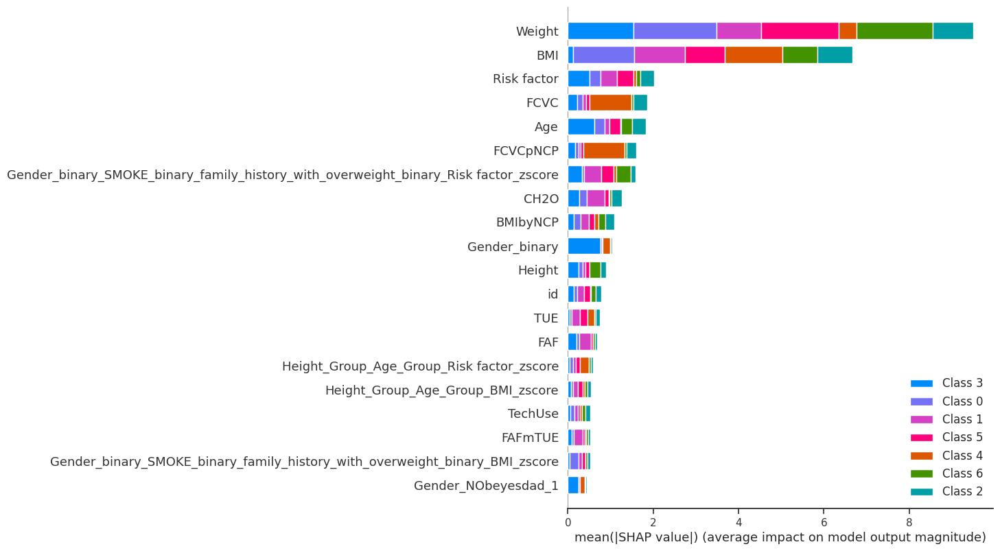

2024-02-06 23:49:53.185896: Start checking if GPU is available for usage.
Invalid Input: 'cuda', valid values are: {'approx', 'auto', 'exact', 'gpu_hist', 'hist'}
Xgboost uses CPU.
2024-02-06 23:49:53.194416: Start checking if GPU is available for usage.
Invalid Input: 'cuda', valid values are: {'approx', 'auto', 'exact', 'gpu_hist', 'hist'}
Xgboost uses CPU.
2024-02-06 23:49:53.198064: Start casting feature types.
2024-02-06 23:49:53.214257: Start filling infinite values.
2024-02-06 23:49:53.219777: Start date column conversion.
2024-02-06 23:49:53.231466: Start checking if DataFrame schema of new data is consistent with previous data.
2024-02-06 23:49:53.233201: Start transforming categories with multiclass target encoder.
2024-02-06 23:49:53.329789: Predicting...
2024-02-06 23:49:53.329925: Start predicting on new data using Xgboost model.
Finished predicting
2024-02-06 23:49:53.724801: Start encoding target labels.
The Matthew correlation is 0.8900860540781613
The accuracy is 0.906

  0%|          | 0/500 [00:00<?, ?it/s]

Best params: {'objective': 'multi:softprob', 'booster': 'gbtree', 'eval_metric': 'mlogloss', 'tree_method': 'exact', 'num_class': 7, 'max_depth': 7, 'alpha': 0.821959669844428, 'lambda': 0.09665747625557164, 'gamma': 1.194127994047654, 'max_leaves': 0, 'subsample': 0.7975176907726776, 'colsample_bytree': 0.6352696926019481, 'colsample_bylevel': 0.9668128192802884, 'eta': 0.29585689944742793, 'steps': 842}
Finished hyperparameter tuning
Start final model training
2024-02-07 00:55:06.290461: Union train and test data for final model training based on TrainingConfig
             param 'use_full_data_for_final_model'
Finished training


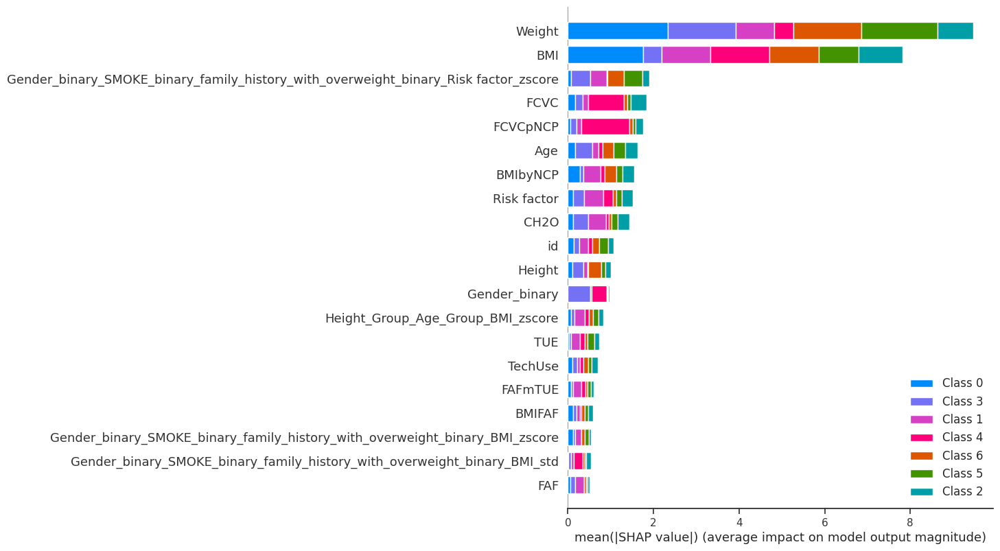

2024-02-07 00:59:14.690626: Start checking if GPU is available for usage.
Invalid Input: 'cuda', valid values are: {'approx', 'auto', 'exact', 'gpu_hist', 'hist'}
Xgboost uses CPU.
2024-02-07 00:59:14.699175: Start checking if GPU is available for usage.
Invalid Input: 'cuda', valid values are: {'approx', 'auto', 'exact', 'gpu_hist', 'hist'}
Xgboost uses CPU.
2024-02-07 00:59:14.702842: Start casting feature types.
2024-02-07 00:59:14.718409: Start filling infinite values.
2024-02-07 00:59:14.723958: Start date column conversion.
2024-02-07 00:59:14.735820: Start checking if DataFrame schema of new data is consistent with previous data.
2024-02-07 00:59:14.737431: Start transforming categories with multiclass target encoder.
2024-02-07 00:59:14.829657: Predicting...
2024-02-07 00:59:14.829797: Start predicting on new data using Xgboost model.
Finished predicting
2024-02-07 00:59:15.220475: Start encoding target labels.
The Matthew correlation is 0.8880609671901581
The accuracy is 0.904

  0%|          | 0/500 [00:00<?, ?it/s]

Best params: {'objective': 'multi:softprob', 'booster': 'gbtree', 'eval_metric': 'mlogloss', 'tree_method': 'exact', 'num_class': 7, 'max_depth': 7, 'alpha': 3.5473820825114144, 'lambda': 1.3213325135698635, 'gamma': 0.9486707373471428, 'max_leaves': 0, 'subsample': 0.8998793269014783, 'colsample_bytree': 0.7866853705222404, 'colsample_bylevel': 0.6255934405422151, 'eta': 0.2859938141773028, 'steps': 629}
Finished hyperparameter tuning
Start final model training
2024-02-07 02:12:10.413555: Union train and test data for final model training based on TrainingConfig
             param 'use_full_data_for_final_model'
Finished training


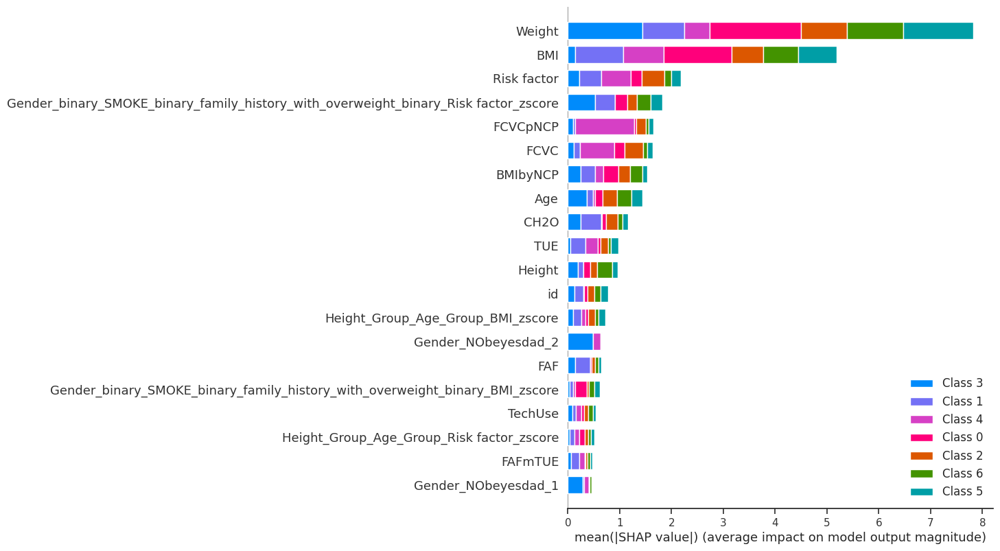

2024-02-07 02:14:48.914042: Start checking if GPU is available for usage.
Invalid Input: 'cuda', valid values are: {'approx', 'auto', 'exact', 'gpu_hist', 'hist'}
Xgboost uses CPU.
2024-02-07 02:14:48.922674: Start checking if GPU is available for usage.
Invalid Input: 'cuda', valid values are: {'approx', 'auto', 'exact', 'gpu_hist', 'hist'}
Xgboost uses CPU.
2024-02-07 02:14:48.926371: Start casting feature types.
2024-02-07 02:14:48.942128: Start filling infinite values.
2024-02-07 02:14:48.947830: Start date column conversion.
2024-02-07 02:14:48.959810: Start checking if DataFrame schema of new data is consistent with previous data.
2024-02-07 02:14:48.961475: Start transforming categories with multiclass target encoder.
2024-02-07 02:14:49.056075: Predicting...
2024-02-07 02:14:49.056219: Start predicting on new data using Xgboost model.
Finished predicting
2024-02-07 02:14:49.448941: Start encoding target labels.
The Matthew correlation is 0.8919060771626758
The accuracy is 0.907

  0%|          | 0/500 [00:00<?, ?it/s]

Best params: {'objective': 'multi:softprob', 'booster': 'gbtree', 'eval_metric': 'mlogloss', 'tree_method': 'exact', 'num_class': 7, 'max_depth': 6, 'alpha': 2.634480871362471, 'lambda': 3.950688094797516, 'gamma': 1.3229028514822567, 'max_leaves': 0, 'subsample': 0.928911543063818, 'colsample_bytree': 0.8807921843494612, 'colsample_bylevel': 0.7324980352891197, 'eta': 0.2918006826947845, 'steps': 172}
Finished hyperparameter tuning
Start final model training
2024-02-07 03:44:56.145787: Union train and test data for final model training based on TrainingConfig
             param 'use_full_data_for_final_model'
Finished training


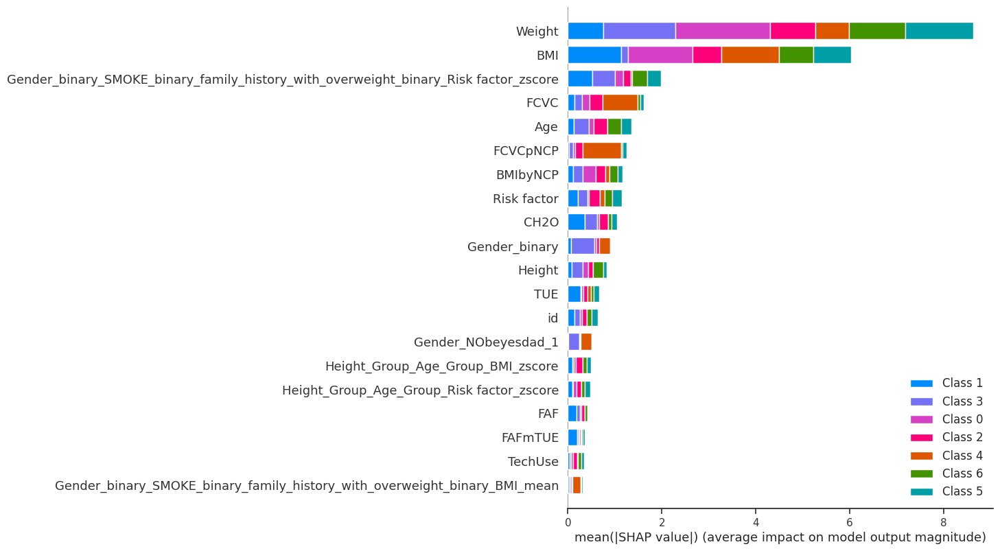

2024-02-07 03:45:46.096167: Start checking if GPU is available for usage.
Invalid Input: 'cuda', valid values are: {'approx', 'auto', 'exact', 'gpu_hist', 'hist'}
Xgboost uses CPU.
2024-02-07 03:45:46.104164: Start checking if GPU is available for usage.
Invalid Input: 'cuda', valid values are: {'approx', 'auto', 'exact', 'gpu_hist', 'hist'}
Xgboost uses CPU.
2024-02-07 03:45:46.107813: Start casting feature types.
2024-02-07 03:45:46.124112: Start filling infinite values.
2024-02-07 03:45:46.129660: Start date column conversion.
2024-02-07 03:45:46.141617: Start checking if DataFrame schema of new data is consistent with previous data.
2024-02-07 03:45:46.143165: Start transforming categories with multiclass target encoder.
2024-02-07 03:45:46.238696: Predicting...
2024-02-07 03:45:46.238847: Start predicting on new data using Xgboost model.
Finished predicting
2024-02-07 03:45:46.594208: Start encoding target labels.
The Matthew correlation is 0.8930265654472361
The accuracy is 0.908

  0%|          | 0/500 [00:00<?, ?it/s]

Best params: {'objective': 'multi:softprob', 'booster': 'gbtree', 'eval_metric': 'mlogloss', 'tree_method': 'exact', 'num_class': 7, 'max_depth': 7, 'alpha': 1.1568945483538309, 'lambda': 2.361315533327401, 'gamma': 1.5670478991583712, 'max_leaves': 0, 'subsample': 0.9402759165743133, 'colsample_bytree': 0.7466508419140819, 'colsample_bylevel': 0.8823459475616455, 'eta': 0.27863639085490877, 'steps': 367}
Finished hyperparameter tuning
Start final model training
2024-02-07 04:43:36.338892: Union train and test data for final model training based on TrainingConfig
             param 'use_full_data_for_final_model'
Finished training


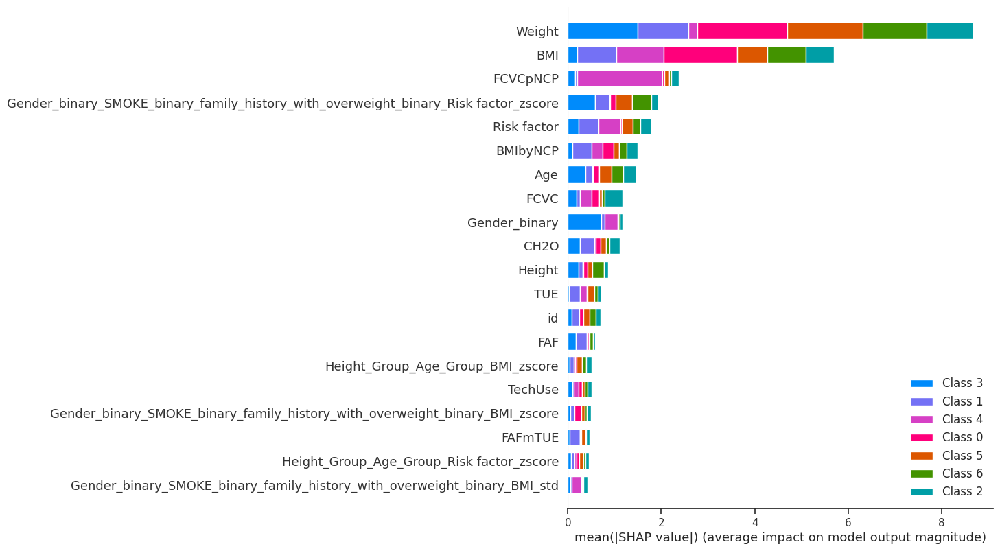

2024-02-07 04:45:36.657537: Start checking if GPU is available for usage.
Invalid Input: 'cuda', valid values are: {'approx', 'auto', 'exact', 'gpu_hist', 'hist'}
Xgboost uses CPU.
2024-02-07 04:45:36.666506: Start checking if GPU is available for usage.
Invalid Input: 'cuda', valid values are: {'approx', 'auto', 'exact', 'gpu_hist', 'hist'}
Xgboost uses CPU.
2024-02-07 04:45:36.670201: Start casting feature types.
2024-02-07 04:45:36.686172: Start filling infinite values.
2024-02-07 04:45:36.691887: Start date column conversion.
2024-02-07 04:45:36.704464: Start checking if DataFrame schema of new data is consistent with previous data.
2024-02-07 04:45:36.706133: Start transforming categories with multiclass target encoder.
2024-02-07 04:45:36.802104: Predicting...
2024-02-07 04:45:36.802245: Start predicting on new data using Xgboost model.
Finished predicting
2024-02-07 04:45:37.174987: Start encoding target labels.
The Matthew correlation is 0.8875941980326568
The accuracy is 0.904

In [42]:
try:
    automl.fit_eval(train.copy(), target_col=target)
except Exception as e:
    print(e)

<a id="toc"></a>

<a href="#toc" style="background-color: #E1B12D; color: #ffffff; padding: 7px 10px; text-decoration: none; border-radius: 50px;">Back to top</a><a id="toc"></a>

<a id="1.2"></a>

# Plot decision trees

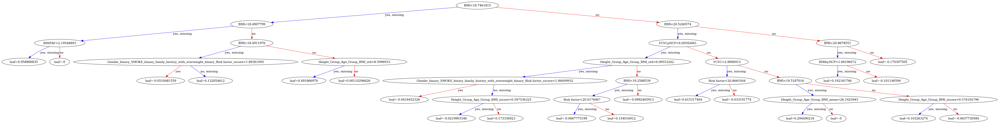

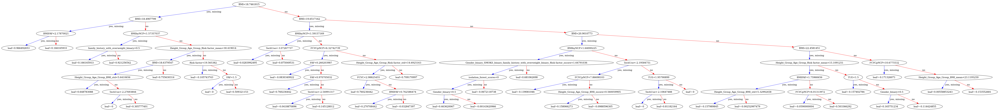

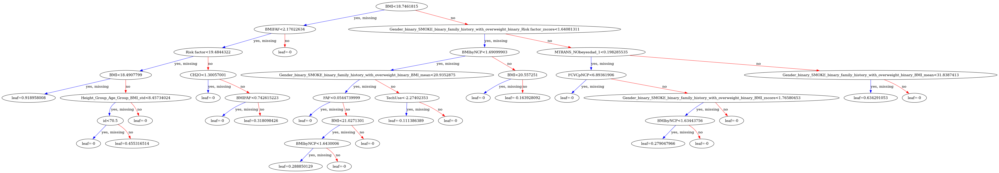

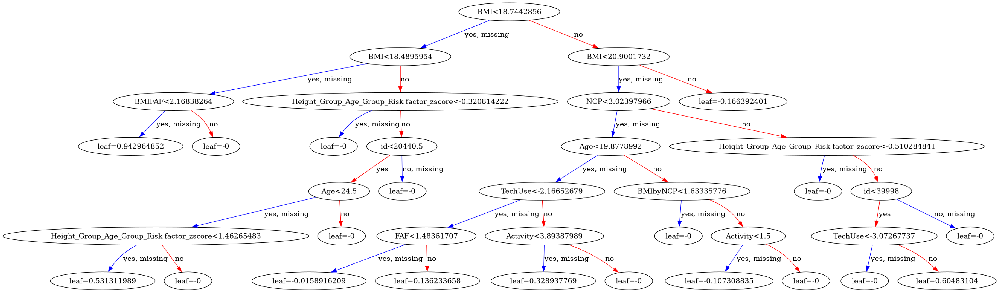

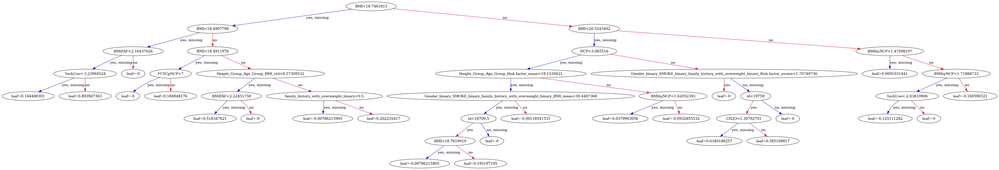

In [43]:
for model in automl.bluecast_models:
    plot_tree(model.ml_model.model)
    fig = plt.gcf()
    fig.set_size_inches(150, 80)
    plt.show()

# Predict on new data

In [44]:
probs, classes = automl.predict(test)

2024-02-07 04:46:20.750495: Start checking if GPU is available for usage.
Invalid Input: 'cuda', valid values are: {'approx', 'auto', 'exact', 'gpu_hist', 'hist'}
Xgboost uses CPU.
2024-02-07 04:46:20.760201: Start checking if GPU is available for usage.
Invalid Input: 'cuda', valid values are: {'approx', 'auto', 'exact', 'gpu_hist', 'hist'}
Xgboost uses CPU.
2024-02-07 04:46:20.764066: Start casting feature types.
2024-02-07 04:46:20.781142: Start filling infinite values.
2024-02-07 04:46:20.797019: Start date column conversion.
2024-02-07 04:46:20.816207: Start checking if DataFrame schema of new data is consistent with previous data.
2024-02-07 04:46:20.819055: Start transforming categories with multiclass target encoder.
2024-02-07 04:46:20.994326: Predicting...
2024-02-07 04:46:20.994573: Start predicting on new data using Xgboost model.
Finished predicting
2024-02-07 04:46:22.063963: Start checking if GPU is available for usage.
Invalid Input: 'cuda', valid values are: {'approx',

# Accessing the inbuilt experiment tracker

BlueCast also keep track of your experiments! Let's see how we can access them.

In [45]:
# access the experiment tracker if needed
tracker = automl.experiment_tracker
tracker

In [46]:
# see all stored information as a Pandas DataFrame
tracker_df = tracker.retrieve_results_as_df()
tracker_df

,experiment_id,score_category,eval_scores,metric_used,metric_higher_is_better,global_random_state,increase_random_state_in_bluecast_cv_by,shuffle_during_training,hyperparameter_tuning_rounds,hyperparameter_tuning_max_runtime_secs,...,num_class,eta,max_depth,alpha,lambda,gamma,max_leaves,subsample,colsample_bytree,colsample_bylevel
0,0,simple_train_test_score,-0.821753,matthew_inverse,False,633,33,True,500,7200,...,7,0.062130,3,0.027469,8.043143,1.501781,0,0.674917,0.303002,0.784499
1,1,simple_train_test_score,-0.894033,matthew_inverse,False,633,33,True,500,7200,...,7,0.081526,6,5.272156,6.336796,1.216578,0,0.930250,0.648308,0.545069
2,2,simple_train_test_score,-0.875403,matthew_inverse,False,633,33,True,500,7200,...,7,0.144085,5,8.984725,3.571823,7.748550,0,0.404323,0.843542,0.732147
3,3,simple_train_test_score,-0.890545,matthew_inverse,False,633,33,True,500,7200,...,7,0.166934,2,3.601289,0.044341,4.270856,0,0.537826,0.947227,0.586230
4,4,simple_train_test_score,-0.893674,matthew_inverse,False,633,33,True,500,7200,...,7,0.149350,3,1.799630,6.311168,1.059964,0,0.770721,0.579448,0.992332
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
398,367,oof_score,0.904002,f1_score_weighted,True,765,33,True,500,7200,...,7,0.278636,7,1.156895,2.361316,1.567048,0,0.940276,0.746651,0.882346
399,367,oof_score,0.904002,log_loss,False,765,33,True,500,7200,...,7,0.278636,7,1.156895,2.361316,1.567048,0,0.940276,0.746651,0.882346
400,367,oof_score,0.904002,balanced_logloss,False,765,33,True,500,7200,...,7,0.278636,7,1.156895,2.361316,1.567048,0,0.940276,0.746651,0.882346
401,367,oof_score,0.904002,roc_auc,True,765,33,True,500,7200,...,7,0.278636,7,1.156895,2.361316,1.567048,0,0.940276,0.746651,0.882346


In [47]:
tracker_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 403 entries, 0 to 402
Data columns (total 41 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   experiment_id                            403 non-null    int64  
 1   score_category                           403 non-null    object 
 2   eval_scores                              403 non-null    float64
 3   metric_used                              403 non-null    object 
 4   metric_higher_is_better                  403 non-null    bool   
 5   global_random_state                      403 non-null    int64  
 6   increase_random_state_in_bluecast_cv_by  403 non-null    int64  
 7   shuffle_during_training                  403 non-null    bool   
 8   hyperparameter_tuning_rounds             403 non-null    int64  
 9   hyperparameter_tuning_max_runtime_secs   403 non-null    int64  
 10  hypertuning_cv_folds                     403 non-n

Let us try to find out what the most important hyperparameters and settings have been so far

<a id="toc"></a>

<a href="#toc" style="background-color: #E1B12D; color: #ffffff; padding: 7px 10px; text-decoration: none; border-radius: 50px;">Back to top</a><a id="toc"></a>

<a id="1.2"></a>

## Understand most impactful parameters across all hyperparameters tests and model trainings

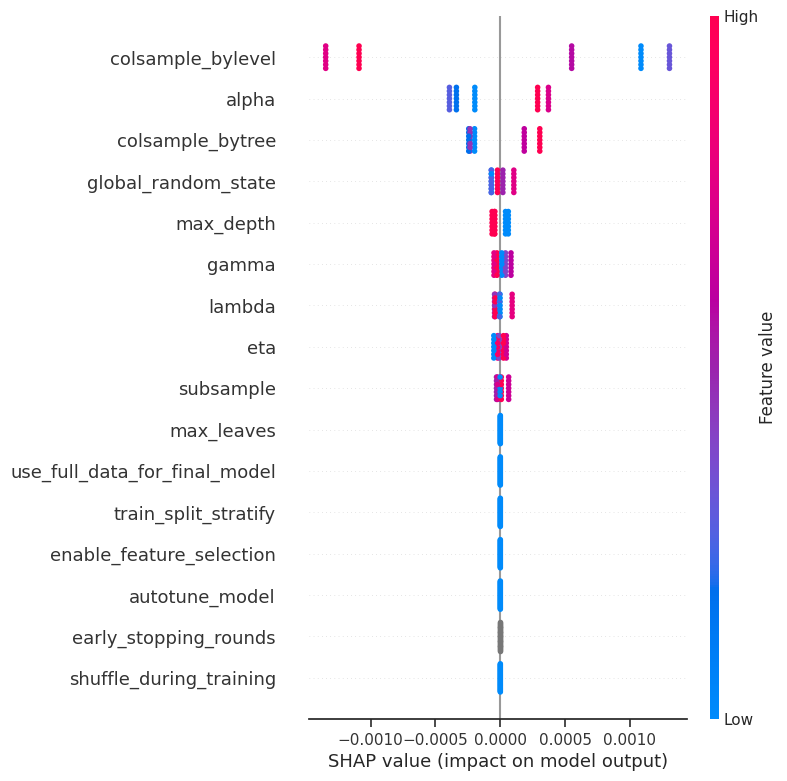

In [48]:
from sklearn.ensemble import RandomForestRegressor
import shap 

cols = [
    "shuffle_during_training",
    "global_random_state",
    "early_stopping_rounds",
    "autotune_model",
    "enable_feature_selection",
    "train_split_stratify",
    "use_full_data_for_final_model",
    "eta",
    "max_depth",
    "alpha",
    "lambda",
    "gamma",
    "max_leaves",
    "subsample",
    "colsample_bytree",
    "colsample_bylevel"
]

regr = RandomForestRegressor(max_depth=4, random_state=0)

tracker_df = tracker_df.loc[tracker_df["score_category"] == "oof_score"]

experiment_feats_df, experiment_feats_target = tracker_df.loc[:, cols], tracker_df.loc[:, "eval_scores"]

regr.fit(experiment_feats_df.fillna(0), experiment_feats_target.fillna(99))

explainer = shap.TreeExplainer(regr)


shap_values = explainer.shap_values(experiment_feats_df)
shap.summary_plot(shap_values, experiment_feats_df)

## Don't lose your progress!

BlueCast offers simple utilities to save and load your pipeline (including the tracker)

In [49]:
# save pipeline including tracker
save_to_production(automl, "/kaggle/working/", "bluecast_cv_pipeline")

# in production or for further experiments this can be loaded again
automl_loaded = load_for_production("/kaggle/working/", "bluecast_cv_pipeline")

2024-02-07 04:46:38.009102: Start saving class instance.
2024-02-07 04:46:39.108612: Start loading class instance.


# Submission time

In [50]:
classes

,0
0,Obesity_Type_II
1,Overweight_Level_I
2,Obesity_Type_III
3,Obesity_Type_I
4,Obesity_Type_III
...,...
13835,Overweight_Level_II
13836,Normal_Weight
13837,Insufficient_Weight
13838,Normal_Weight


In [51]:
submission[target] = classes
submission.to_csv('submission.csv', index=False)

In [52]:
submission

,id,NObeyesdad
0,20758,Obesity_Type_II
1,20759,Overweight_Level_I
2,20760,Obesity_Type_III
3,20761,Obesity_Type_I
4,20762,Obesity_Type_III
...,...,...
13835,34593,Overweight_Level_II
13836,34594,Normal_Weight
13837,34595,Insufficient_Weight
13838,34596,Normal_Weight


<a id="toc"></a>

<a href="#toc" style="background-color: #E1B12D; color: #ffffff; padding: 7px 10px; text-decoration: none; border-radius: 50px;">Back to top</a><a id="toc"></a>

<a id="1.2"></a>